In [1]:
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from wordcloud import WordCloud, ImageColorGenerator
import nltk
import re
import plotly.express as px
from decimal import *

In [2]:
true_data_original = pd.read_csv("./True.csv")
fake_data_original = pd.read_csv("./Fake.csv")

In [3]:
true_data_original.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [4]:
fake_data_original.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [5]:
test_count = 4000

fake_data = fake_data_original[0:fake_data_original.shape[0] - test_count]
true_data = true_data_original[0:true_data_original.shape[0] - test_count]

print("Amount of true news: {}".format(true_data.shape[0]))
print("Amount of fake news: {}\n".format(fake_data.shape[0]))

data = fake_data.append(true_data)

print("Amount of all news: {}\n".format(data.shape[0]))

fake_data_test = fake_data_original[fake_data_original.shape[0] - test_count:]
true_data_test = true_data_original[true_data_original.shape[0] - test_count:]
fake_data_test.reset_index(drop=True, inplace=True)
true_data_test.reset_index(drop=True, inplace=True)

print("Amount of true test news: {}".format(true_data_test.shape[0]))
print("Amount of fake test news: {}".format(fake_data_test.shape[0]))

Amount of true news: 17417
Amount of fake news: 19481

Amount of all news: 36898

Amount of true test news: 4000
Amount of fake test news: 4000


In [6]:
nltk.download("stopwords")
pd.set_option('mode.chained_assignment', None)

def preprocess(df):
    stopwords = nltk.corpus.stopwords.words('english')
    df['text_pre'] = df['text']
    df['text_pre'] = df['text_pre'].apply(lambda x : x.lower())
    df['text_pre'] = df['text_pre'].apply(lambda x : x.split(" "))
    df['text_pre'] = df['text_pre'].apply(lambda x : [item for item in x if item not in stopwords])
    df['text_pre'] = df['text_pre'].apply(lambda x : " ".join(x))
    df['text_pre'] = df['text_pre'].str.replace('@([A-Za-z0-9_]+)', "twittername")
    df['text_pre'] = df['text_pre'].str.replace('https?:\/\/.*[\r\n]*', '')
    df['text_pre'] = df['text_pre'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
    df['text_pre'] = df['text_pre'].str.replace('\d+', '')
    df['text_pre'] = df['text_pre'].str.replace('[^\w\s]', '')
    return df

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\SSJSR\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [7]:
fake_data = preprocess(fake_data)
true_data = preprocess(true_data)
data = preprocess(data)

In [8]:
#fake_data.loc[0]["text"]

In [9]:
fake_data.loc[0]["text_pre"]

'donald trump wish americans happy new year leave that instead give shout enemies haters  dishonest fake news media  former reality show star one job it country rapidly grows stronger smarter want wish friends supporters enemies haters even dishonest fake news media happy healthy new year  president angry pants tweeted   great year america country rapidly grows stronger smarter want wish friends supporters enemies haters even dishonest fake news media happy healthy new year  great year america  donald j trump twittername december  trump tweet went welll expectwhat kind president sends new year greeting like despicable petty infantile gibberish trump lack decency even allow rise gutter long enough wish american citizens happy new year  bishop talbert swan twittername december  no one likes  calvin twittername december  your impeachment would make  great year america also accept regaining control congress  miranda yaver twittername december  do hear talk include many people hate wonder h

In [10]:
fake_data['is_fake'] = 1
true_data['is_fake'] = 0

In [11]:
def text_size(df):
    sizes = []
    for text in df['text']:
        len_ = len(text.split())
        sizes.append(len_)
    return np.array(sizes)

def text_size_preprocess(df):
    sizes = []
    for text in df['text_pre']:
        len_ = len(text.split())
        sizes.append(len_)
    return np.array(sizes)

In [12]:
fake_size = text_size(fake_data)
true_size = text_size(true_data)
fake_data['len'] = fake_size
true_data['len'] = true_size

In [13]:
true_data.head()

,title,text,subject,date,text_pre,is_fake,len
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",washington reuters head conservative republic...,0,749
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",washington reuters transgender people allowed...,0,624
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",washington reuters special counsel investigat...,0,457
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",washington reuters trump campaign adviser geo...,0,376
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",seattlewashington reuters president donald tr...,0,852


In [14]:
fig = px.box(pd.concat([fake_data, true_data]), y='len', x='is_fake', title="Distribution of news' length", width=1024, height=768)
fig.show()

In [15]:
fake_size_pre = text_size_preprocess(fake_data)
true_size_pre = text_size_preprocess(true_data)
fake_data["len_pre"] = fake_size_pre
true_data["len_pre"] = true_size_pre

In [16]:
fig = px.box(pd.concat([fake_data, true_data]), y='len_pre', x='is_fake', title="Distribution of news' length (preprocessed)", width=1024, height=768)
fig.show()

In [17]:
def unique_words(df):
    unique_words = set()
    for words in df["text"]:
        splited = words.split()
        for word in splited:
            unique_words.add(word)
    return unique_words

def unique_words_preprocess(df):
    unique_words = set()
    for words in df["text_pre"]:
        splited = words.split()
        for word in splited:
            unique_words.add(word)
    return unique_words

In [18]:
true_unique_words = unique_words(true_data)
fake_unique_words = unique_words(fake_data)

In [19]:
fig = px.bar(y=[len(true_unique_words), len(fake_unique_words)], x=["true", "fake"], title="Unique words", width=1024, height=768)
fig.show()

In [20]:
true_unique_words_pre = unique_words_preprocess(true_data)
fake_unique_words_pre = unique_words_preprocess(fake_data)

In [21]:
fig = px.bar(y=[len(true_unique_words_pre), len(fake_unique_words_pre)], x=["true", "fake"], title="Unique words (preprocessed)", width=1024, height=768)
fig.show()

In [22]:
word_distribution = {}
total_fake_words = 0
total_true_words = 0

for idx in fake_data.index:
    words = fake_data.loc[idx]["text_pre"].split()
    total_fake_words += len(words)
    for word in words:
        if word not in word_distribution:
            word_distribution[word] = {"true": 1, "fake": 1}
        else:
            word_distribution[word]["fake"] += 1

for idx in true_data.index:
    words = true_data.loc[idx]["text_pre"].split()
    total_true_words += len(words)
    for word in words:
        if word not in word_distribution:
            word_distribution[word] = {"true": 1, "fake": 1}
        else:
            word_distribution[word]["true"] += 1

In [23]:
print(word_distribution["turkey"])

{'true': 1486, 'fake': 166}


In [24]:
print(word_distribution["reuters"])

{'true': 22979, 'fake': 244}


In [25]:
true_words = [word_distribution[k]["true"] for k in word_distribution.keys()]
fake_words = [word_distribution[k]["fake"] for k in word_distribution.keys()]
names = [k for k in word_distribution.keys()]

In [26]:
frm = pd.DataFrame(zip(true_words, fake_words), columns=["true_freq", "false_freq"])
fig = px.scatter(frm, x="true_freq", y="false_freq", hover_name=names, width=1024, height=768, title="Frequency of words")
fig.show()

In [27]:
#fig = px.scatter(frm, x="true_freq", y="false_freq", hover_name=names, log_x=True, log_y=True, width=1024, height=768, title="Frequency of words (log scaled)")
#fig.show()

In [28]:
fake_word_counts = {k: word_distribution[k]['fake'] for k in word_distribution.keys()}
fake_keys = list(fake_word_counts.keys())
fake_values = list(fake_word_counts.values())
print(*list(zip(fake_keys[0: 10], fake_values[0: 10])), sep="\n")

('donald', 14718)
('trump', 62943)
('wish', 456)
('americans', 4794)
('happy', 709)
('new', 10008)
('year', 5203)
('leave', 1249)
('that', 4071)
('instead', 2269)


In [29]:
fake_word_counts = {k: v for k, v in sorted(fake_word_counts.items(), key=lambda item: item[1], reverse=True)}
fake_keys = list(fake_word_counts.keys())
fake_values = list(fake_word_counts.values())
print(*list(zip(fake_keys[0: 10], fake_values[0: 10])), sep="\n")

('trump', 62943)
('said', 23921)
('president', 20774)
('people', 20559)
('would', 18019)
('one', 17184)
('twittername', 16004)
('donald', 14718)
('obama', 13952)
('like', 13451)


In [30]:
fake_frequency = pd.DataFrame(zip(fake_keys[0: 50], fake_values[0: 50]), columns=["word", "frequency"])
fig = px.bar(fake_frequency, x="word", y="frequency", title="Fake news frequency words", width=1024, height=768)
fig.show()

In [31]:
true_word_counts = {k: word_distribution[k]['true'] for k in word_distribution.keys()}
true_word_counts = {k: v for k, v in sorted(true_word_counts.items(), key=lambda item: item[1], reverse=True)}
true_keys = list(true_word_counts.keys())
true_values = list(true_word_counts.values())

In [32]:
true_frequency = pd.DataFrame(zip(true_keys[0: 50], true_values[0: 50]), columns=["word", "frequency"])
fig = px.bar(true_frequency, x="word", y="frequency", title="True news frequency words", width=1024, height=768)
fig.show()

In [33]:
text_general = " ".join(dta for dta in data['text_pre'])
print("There are {} words.".format(len(text_general.split())))

There are 8050501 words.


In [34]:
general_color_mask = np.array(Image.open("./masks/color_mask9.png"))
general_image_colors = ImageColorGenerator(general_color_mask)

In [35]:
wordcloud_general = WordCloud(background_color="white", max_words=1000, color_func=general_image_colors, min_font_size=7, width=1280, height=720).generate(text_general)

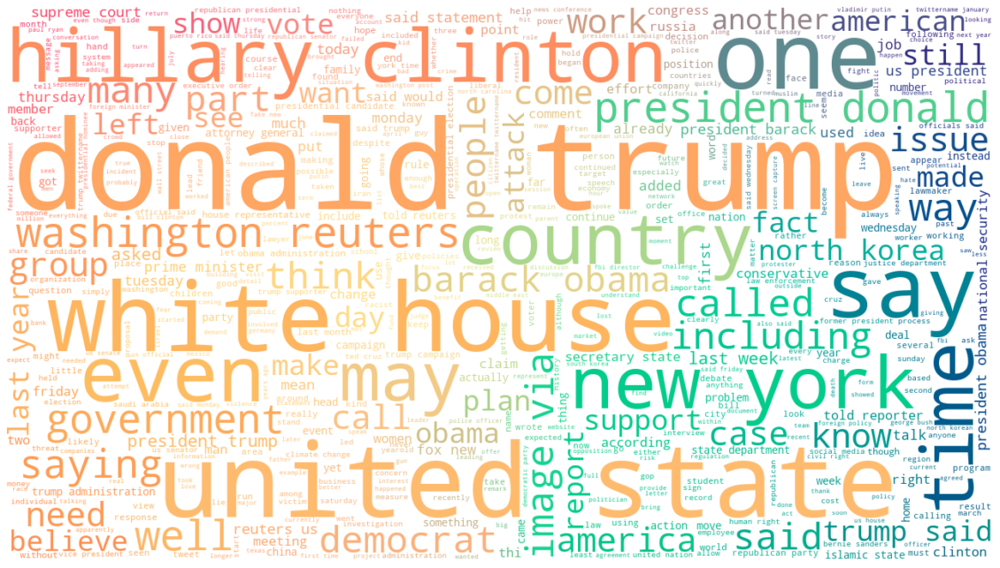

In [36]:
# General Wordcloud
plt.rcParams["figure.figsize"] = (20,20)
plt.imshow(wordcloud_general, interpolation='bilinear')
plt.axis("off")
plt.show()

In [37]:
fake_text = " ".join(fakes for fakes in fake_data['text_pre'])
print("There are {} words in fake news.".format(len(fake_text.split())))

There are 3991523 words in fake news.


In [38]:
fake_color_mask = np.array(Image.open("./masks/color_mask10.png"))
fake_image_colors = ImageColorGenerator(fake_color_mask)

In [39]:
trump_mask = np.array(Image.open("./masks/trump.png"))
#trump_mask

In [40]:
transformed_trump_mask = np.ndarray([trump_mask.shape[0], trump_mask.shape[1]], np.int32)
for i in tqdm(range(len(trump_mask))):
    transformed_trump_mask[i] = list(map(lambda x: 255 if x == 0 else x, trump_mask[i]))
#transformed_trump_mask

NameError: name 'tqdm' is not defined

In [ ]:
wordcloud_fake_trump = WordCloud(background_color="white", mask=transformed_trump_mask, max_words=2000, contour_color="black", contour_width=2, color_func=fake_image_colors, width=1280, height=720).generate(fake_text)

In [ ]:
# Masked Fake Wordcloud
plt.imshow(wordcloud_fake_trump, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
true_text = " ".join(trues for trues in true_data['text_pre'])
print("There are {} words in true news.".format(len(true_text.split())))

In [ ]:
true_color_mask = np.array(Image.open("./masks/color_mask5.png"))
true_image_colors = ImageColorGenerator(true_color_mask)

In [ ]:
truth_mask = np.array(Image.open("./masks/truth.png"))
#truth_mask

In [ ]:
red, green, blue = truth_mask[:, :, 0], truth_mask[:, :, 1], truth_mask[:, :, 2]
mask = (red < 128) & (green < 128) & (blue < 128)
mask2 = (red >= 128) & (green >= 128) & (blue >= 128)
truth_mask[:, :, :3][mask] = [0, 0, 0]
truth_mask[:, :, :3][mask2] = [255, 255, 255]
#truth_mask

In [ ]:
wordcloud_true_truth = WordCloud(background_color="white", max_words=5000, mask=truth_mask, color_func=true_image_colors, width=1280, height=720).generate(true_text)

In [ ]:
# Masked True Wordcloud
plt.imshow(wordcloud_true_truth, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
print("Total true words: {}".format(total_true_words))
print("Total fake words: {}\n".format(total_fake_words))

p_true = total_true_words / (total_true_words + total_fake_words)
p_fake = total_fake_words / (total_true_words + total_fake_words)

print("General probability of true words: {}"
"\nGeneral probability of fake words: {}".format(p_true, p_fake))

In [ ]:
probabilities = {}
for word in tqdm(word_distribution):
    p_word_true = word_distribution[word]["true"] / total_true_words
    p_word_fake = word_distribution[word]["fake"] / total_fake_words
    probabilities[word] = {"true": p_word_true, "fake": p_word_fake}

In [ ]:
word = "trump"
print("Raw probabilities: {}\n".format(probabilities[word]))

print("The word '{}' is in {:.2f}% true news.".format(word, probabilities[word]["true"] * 100 / (probabilities[word]["true"] + probabilities[word]["fake"])))
print("The word '{}' is in {:.2f}% fake news.".format(word, probabilities[word]["fake"] * 100 / (probabilities[word]["true"] + probabilities[word]["fake"])))

In [ ]:
true_data_test = preprocess(true_data_test)
fake_data_test = preprocess(fake_data_test)

In [ ]:
X = fake_data_test.loc[0]["text_pre"]
X = [i for i in X.split()]
#print(X)

In [ ]:
print(len(X))

In [ ]:
X_true = Decimal(1.0)
X_fake = Decimal(1.0)

for word in X:
    if word in probabilities:
        X_true *= Decimal(probabilities[word]["true"])
        X_fake *= Decimal(probabilities[word]["fake"])
    else:
        print("'{}' word does not exist in probabilities!".format(word))

In [ ]:
print("P(X|true) = {}".format(Decimal(X_true)))
print("P(X|fake) = {}".format(Decimal(X_fake)))
# true_percent = (Decimal(X_true) * 100) / (Decimal(X_true) + Decimal(X_fake))
# false_percent = (Decimal(X_fake) * 100) / (Decimal(X_true) + Decimal(X_fake))
# print(true_percent)
# print(false_percent)

In [ ]:
p_Xtrue_and_true = Decimal(X_true) * Decimal(p_true)
p_Xfake_and_fake = Decimal(X_fake) * Decimal(p_fake)

print("P(true|X) = {}".format(p_Xtrue_and_true))
print("P(fake|X) = {}".format(p_Xfake_and_fake))

In [ ]:
if Decimal(p_Xtrue_and_true) > Decimal(p_Xfake_and_fake):
    print("TRUE")
else:
    print("FAKE")

In [ ]:
def decide(X, probabilities, p_true, p_fake):
    X_true = Decimal(1.0)
    X_fake = Decimal(1.0)
    for word in X.split():
        if word in probabilities:
            X_true *= Decimal(probabilities[word]["true"])
            X_fake *= Decimal(probabilities[word]["fake"])
        else:
            continue

    p_Xtrue_and_true = Decimal(X_true) * Decimal(p_true)
    p_Xfake_and_fake = Decimal(X_fake) * Decimal(p_fake)
    
    return p_Xtrue_and_true > p_Xfake_and_fake

In [ ]:
all_fake_tests = [True if not decide(fake_data_test.loc[X]["text_pre"], probabilities, p_true, p_fake) else False for X in fake_data_test.index]

In [ ]:
fake_accuracy = all_fake_tests.count(True) / len(all_fake_tests)
print("Accuracy for fakes: {}".format(fake_accuracy))

In [ ]:
all_true_tests = [True if decide(true_data_test.loc[X]["text_pre"], probabilities, p_true, p_fake) else False for X in true_data_test.index]

In [ ]:
true_accuracy = all_true_tests.count(True) / len(all_true_tests)
print("Accuracy for trues: {}".format(true_accuracy))

In [ ]:
fake_accuracy * true_accuracy